Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


DIRAC annotate training..:   0%|          | 0/100 [00:00<?, ?it/s]

{'Accuracy Score': 0.9590417310664606, 'Precision Score': 0.9242593903768067, 'Recall Score': 0.9590417310664606, 'F1 Score': 0.9408632228518364, 'Unassigned Rate': 0.14446280991735538}
############### [Batch 1] Randomly dropped cell types from source: ['7_9'] ###############


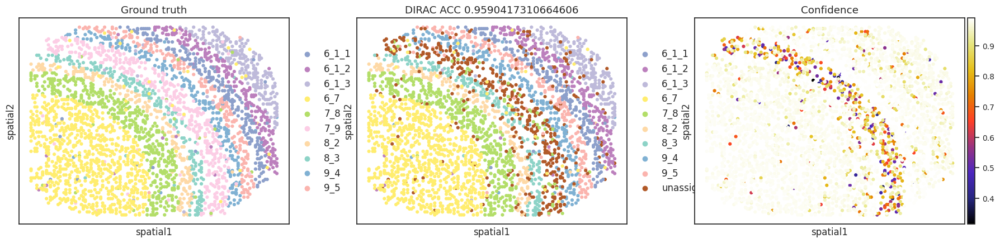

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


DIRAC annotate training..:   0%|          | 0/100 [00:00<?, ?it/s]

{'Accuracy Score': 0.9701919150673745, 'Precision Score': 0.9427895783118204, 'Recall Score': 0.9701919150673745, 'F1 Score': 0.9560175163505554, 'Unassigned Rate': 0.15697074010327028}
############### [Batch 2] Randomly dropped cell types from source: ['7_9'] ###############


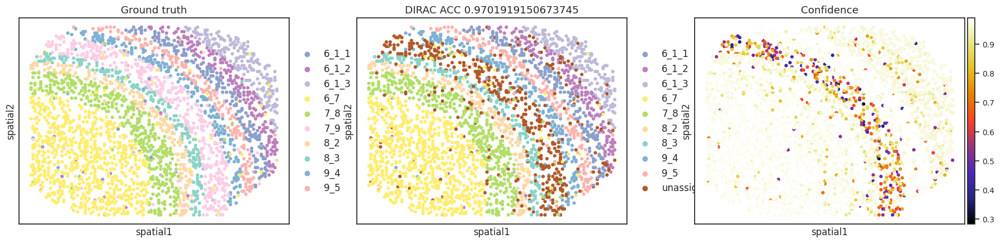

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


DIRAC annotate training..:   0%|          | 0/100 [00:00<?, ?it/s]

{'Accuracy Score': 0.9697211155378486, 'Precision Score': 0.9446799376242936, 'Recall Score': 0.9697211155378486, 'F1 Score': 0.9567103823817008, 'Unassigned Rate': 0.1638907395069953}
############### [Batch 3] Randomly dropped cell types from source: ['7_9'] ###############


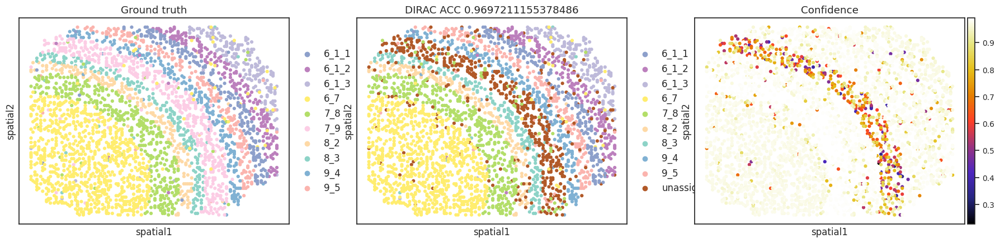

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


DIRAC annotate training..:   0%|          | 0/100 [00:00<?, ?it/s]

{'Accuracy Score': 0.972488038277512, 'Precision Score': 0.949456479958233, 'Recall Score': 0.972488038277512, 'F1 Score': 0.9605722112699641, 'Unassigned Rate': 0.1720039617035325}
############### [Batch 4] Randomly dropped cell types from source: ['7_9'] ###############


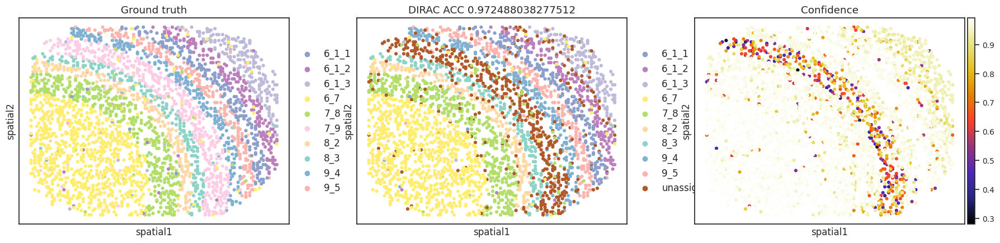

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


DIRAC annotate training..:   0%|          | 0/100 [00:00<?, ?it/s]

{'Accuracy Score': 0.974298141557928, 'Precision Score': 0.9511539287185161, 'Recall Score': 0.974298141557928, 'F1 Score': 0.9623100693126786, 'Unassigned Rate': 0.16781836130306027}
############### [Batch 5] Randomly dropped cell types from source: ['7_9'] ###############


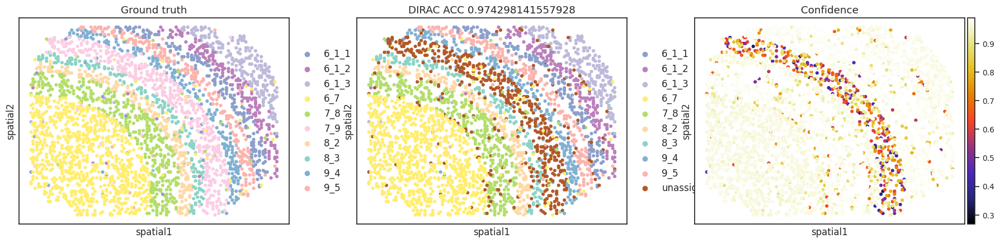

In [31]:
######## layers data + RNA
import os
import random

import pandas as pd
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt
import anndata
import sklearn
import scipy
import yaml

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/DIRAC")
import diracv5 as sd

sd.utils.seed_torch(seed=0)

data_path = "/home/project/11003054/changxu/Projects/DIRAC/Section-4"
methods = "DIRAC"
sim_methods = "layers"
omics = "RNA"
tasks = "remove_one_celltype"
colormaps= ["#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", 
            "#CAB2D6","#6A3D9A", "#B15928"]

adata = anndata.read_h5ad(os.path.join(data_path, "scMultiSim_data", f"sim-{sim_methods}", f"sim_{omics}_0.h5ad"))
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.scale(adata)
colormaps_clusters = dict(set(zip(adata.obs["cell.type"].unique(), colormaps)))
colormaps_clusters['unassigned'] = "#B15928"

results_list = []
for j in range(1, 6):
    save_path = os.path.join(data_path, "Results", f"merged_{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}")
    if not os.path.exists(save_path):
        os.makedirs(save_path)


    source_adata_raw = adata[adata.obs["batch"] != j]
    target_adata = adata[adata.obs["batch"] == j]
    source_celltypes = source_adata_raw.obs['cell.type'].unique()
    drop_celltypes = ['7_9']

    source_adata = source_adata_raw[~source_adata_raw.obs['cell.type'].isin(drop_celltypes)].copy()
    source_edge_index = sd.utils.get_single_edge_index(source_adata.obsm["spatial"], n_neighbors = 10)
    source_edge_index = torch.LongTensor(source_edge_index).T
    target_edge_index = sd.utils.get_single_edge_index(target_adata.obsm["spatial"],  n_neighbors = 10)
    target_edge_index = torch.LongTensor(target_edge_index).T 

    annotate = sd.main.annotate_app(save_path = save_path, use_gpu=True)
    samples = annotate._get_data(
                    source_data = source_adata.X,
                    source_label = source_adata.obs['cell.type'],
                    source_edge_index = source_edge_index,
                    target_data = target_adata.X,
                    target_edge_index = target_edge_index,
                    num_parts_source = source_adata.shape[0] // 200,
                    num_parts_target = target_adata.shape[0] // 200,
                    weighted_classes=False,
                    )

    models = annotate._get_model(samples=samples, opt_GNN = "SAGE")
    results = annotate._train_dirac_annotate(samples=samples, 
                                                 models=models, 
                                                 n_epochs=100,
                                                 filter_low_confidence = True,
                                                 confidence_threshold = 0.9,                                       
                                                )

    source_adata = source_adata.copy()
    target_adata = target_adata.copy()

    target_adata.obs[f"{methods}_pred"] = results["target_pred_filtered"]
    target_adata.obs[f"{methods}"] = target_adata.obs[f"{methods}_pred"].map(results['pairs_filter'])
    target_adata.obs["Confidence"] = results['target_confs']

    valid_mask = target_adata.obs[f"{methods}"] != "unassigned"
    filtered_target = target_adata[valid_mask].copy()
    metrics_all = {
                "Accuracy Score": float(sklearn.metrics.accuracy_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"])),
                "Precision Score": float(sklearn.metrics.precision_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted', zero_division=0)),
                "Recall Score": float(sklearn.metrics.recall_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted')),
                "F1 Score": float(sklearn.metrics.f1_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted')),
                "Unassigned Rate": float(1 - len(filtered_target)/len(target_adata))
                    }
    print(metrics_all)
    with open(os.path.join(save_path, f"annotate_mertics_{tasks}_batch_{j}.yaml"), "w", encoding="utf-8") as g:
        yaml.dump(metrics_all, g, default_flow_style=False, allow_unicode=True)
    results_list.append(pd.Series(metrics_all, name=f"batch_{j}"))

    print(f"############### [Batch {j}] Randomly dropped cell types from source: {drop_celltypes} ###############")
    sc.pl.embedding(target_adata, basis='spatial', color=['cell.type', f'{methods}', "Confidence"], 
                        title=['Ground truth',f"DIRAC ACC {metrics_all['Accuracy Score']}", "Confidence"], 
                        s=80, show=False, palette = colormaps_clusters, color_map="CMRmap")
    plt.savefig(os.path.join(save_path, f"{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}.pdf"), dpi=300)
    plt.show()        
    target_adata.obs.to_csv(os.path.join(save_path, f"{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}.csv"))
        
summary_df = pd.DataFrame(results_list)
summary_df.to_csv(os.path.join(data_path, "Results", f"sim_metrics_{omics}_{methods}_{sim_methods}_{tasks}.csv"))

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!
DIRAC annotate training..: 100%|█| 100


{'Accuracy Score': 0.920906200317965, 'Precision Score': 0.8569953701915259, 'Recall Score': 0.920906200317965, 'F1 Score': 0.8861648672296336, 'Unassigned Rate': 0.16826446280991736}
############### [Batch 1] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


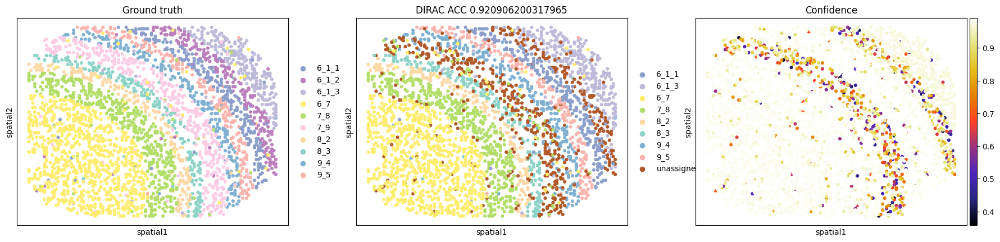

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!
DIRAC annotate training..: 100%|█| 100


{'Accuracy Score': 0.9386296763345944, 'Precision Score': 0.8849646562648488, 'Recall Score': 0.9386296763345944, 'F1 Score': 0.9101233749221493, 'Unassigned Rate': 0.18106712564543892}
############### [Batch 2] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


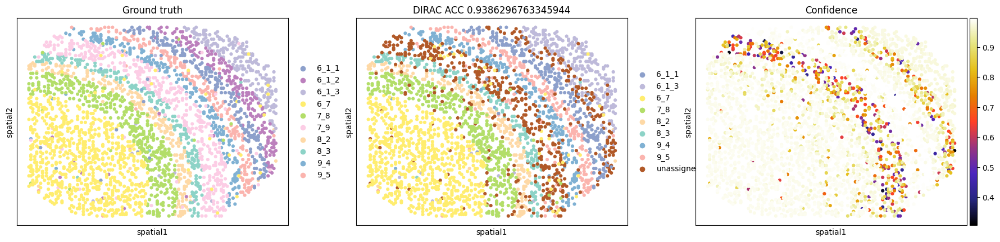

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!
DIRAC annotate training..: 100%|█| 100


{'Accuracy Score': 0.9038004750593824, 'Precision Score': 0.8270166753354642, 'Recall Score': 0.9038004750593824, 'F1 Score': 0.8617201936534572, 'Unassigned Rate': 0.15856095936042636}
############### [Batch 3] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


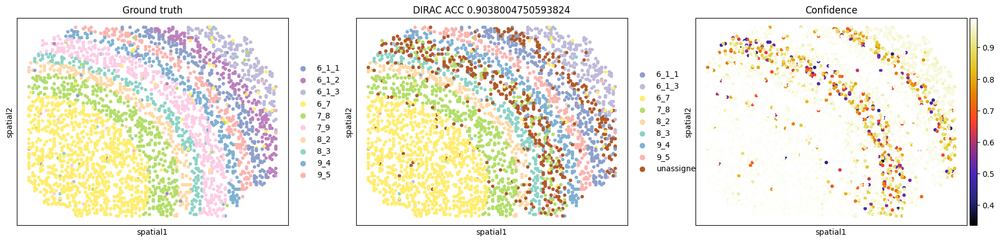

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!
DIRAC annotate training..: 100%|█| 100


{'Accuracy Score': 0.944624090541633, 'Precision Score': 0.8962256761584806, 'Recall Score': 0.944624090541633, 'F1 Score': 0.9191895376910671, 'Unassigned Rate': 0.18322878837900292}
############### [Batch 4] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


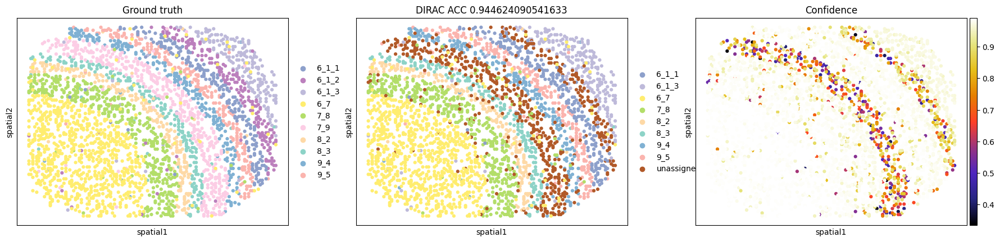

Identified 2 unique domains.


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!
DIRAC annotate training..: 100%|█| 100


{'Accuracy Score': 0.9316, 'Precision Score': 0.8751323885711645, 'Recall Score': 0.9316, 'F1 Score': 0.9010166924789186, 'Unassigned Rate': 0.17736097400460682}
############### [Batch 5] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


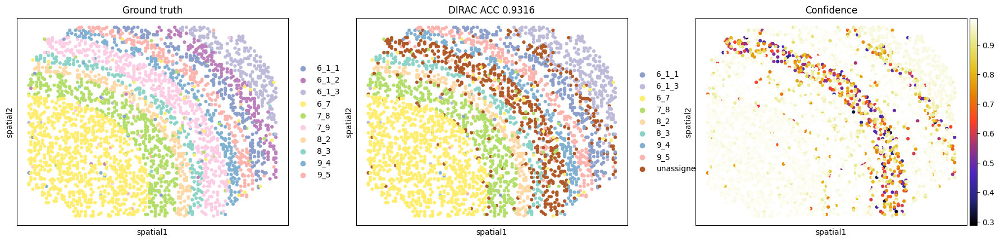

In [12]:
############# Find new cell type on remove 2 cell types + layers

import os
import random

import pandas as pd
import numpy as np
import torch
import scanpy as sc
import matplotlib.pyplot as plt
import anndata
import sklearn
import scipy
import yaml

import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

import sys
sys.path.append("/home/project/11003054/changxu/Projects/DIRAC/DIRAC")
import diracv5 as sd

sd.utils.seed_torch(seed=0)

data_path = "/home/users/nus/changxu/scratch/DIRAC/Section-4"
methods = "DIRAC"
sim_methods = "layers"
omics = "RNA"
tasks = "remove_two_celltype"
colormaps= ["#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", 
            "#CAB2D6","#6A3D9A", "#B15928"]

adata = anndata.read_h5ad(os.path.join(data_path, "scMultiSim_data", f"sim-{sim_methods}", f"sim_{omics}_0.h5ad"))
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.scale(adata)

results_list = []
for j in range(1, 6):
    save_path = os.path.join(data_path, "Results", f"merged_{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}")
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    colormaps_clusters = dict(set(zip(adata.obs["cell.type"].unique(), colormaps)))
    colormaps_clusters['unassigned'] = "#B15928"
    source_adata_raw = adata[adata.obs["batch"] != j]
    target_adata = adata[adata.obs["batch"] == j]
    source_celltypes = source_adata_raw.obs['cell.type'].unique()
    drop_celltypes = ['7_9', '6_1_2']
    
    source_adata = source_adata_raw[~source_adata_raw.obs['cell.type'].isin(drop_celltypes)].copy()
    source_edge_index = sd.utils.get_single_edge_index(source_adata.obsm["spatial"], n_neighbors = 10)
    source_edge_index = torch.LongTensor(source_edge_index).T
    target_edge_index = sd.utils.get_single_edge_index(target_adata.obsm["spatial"],  n_neighbors = 10)
    target_edge_index = torch.LongTensor(target_edge_index).T 

    annotate = sd.main.annotate_app(save_path = save_path, use_gpu=True)
    samples = annotate._get_data(
                    source_data = source_adata.X,
                    source_label = source_adata.obs['cell.type'],
                    source_edge_index = source_edge_index,
                    target_data = target_adata.X,
                    target_edge_index = target_edge_index,
                    num_parts_source = source_adata.shape[0] // 200,
                    num_parts_target = target_adata.shape[0] // 200,
                    weighted_classes=False,
                    )

    models = annotate._get_model(samples=samples, opt_GNN = "SAGE")
    results = annotate._train_dirac_annotate(samples=samples, 
                                                 models=models, 
                                                 n_epochs=100,
                                                 filter_low_confidence = True,
                                                 confidence_threshold = 0.9,                                       
                                                )

    source_adata = source_adata.copy()
    target_adata = target_adata.copy()

    target_adata.obs[f"{methods}_pred"] = results["target_pred_filtered"]
    target_adata.obs[f"{methods}"] = target_adata.obs[f"{methods}_pred"].map(results['pairs_filter'])
    target_adata.obs["Confidence"] = results['target_confs']

    valid_mask = target_adata.obs[f"{methods}"] != "unassigned"
    filtered_target = target_adata[valid_mask].copy()
    metrics_all = {
                "Accuracy Score": float(sklearn.metrics.accuracy_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"])),
                "Precision Score": float(sklearn.metrics.precision_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted', zero_division=0)),
                "Recall Score": float(sklearn.metrics.recall_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted')),
                "F1 Score": float(sklearn.metrics.f1_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted')),
                "Unassigned Rate": float(1 - len(filtered_target)/len(target_adata))
                    }
    print(metrics_all)
    with open(os.path.join(save_path, f"annotate_mertics_{tasks}_batch_{j}.yaml"), "w", encoding="utf-8") as g:
        yaml.dump(metrics_all, g, default_flow_style=False, allow_unicode=True)
    results_list.append(pd.Series(metrics_all, name=f"batch_{j}"))
    print(f"############### [Batch {j}] Randomly dropped cell types from source: {drop_celltypes} ###############")
    sc.pl.embedding(target_adata, basis='spatial', color=['cell.type', f'{methods}', "Confidence"], 
                        title=['Ground truth',f"DIRAC ACC {metrics_all['Accuracy Score']}", "Confidence"], 
                        s=80, show=False, palette = colormaps_clusters, color_map="CMRmap")
    plt.savefig(os.path.join(save_path, f"{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}.pdf"), dpi=300)
    plt.show()        
    target_adata.obs.to_csv(os.path.join(save_path, f"{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}.csv"))
        
summary_df = pd.DataFrame(results_list)
summary_df.to_csv(os.path.join(data_path, "Results", f"sim_metrics_{omics}_{methods}_{sim_methods}_{tasks}.csv"))

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.509705


Computing METIS partitioning...
Done!


Loss: 0.646372


Computing METIS partitioning...
Done!


Loss: 0.409962


Computing METIS partitioning...
Done!


Loss: 0.332421


Computing METIS partitioning...
Done!


Loss: 0.305447


Computing METIS partitioning...
Done!


Loss: 0.294489


Computing METIS partitioning...
Done!


Loss: 0.300097


Computing METIS partitioning...
Done!


Loss: 0.296544


Computing METIS partitioning...
Done!


Loss: 0.299546


Computing METIS partitioning...
Done!


Loss: 0.302517


Computing METIS partitioning...
Done!


Loss: 0.296861


Computing METIS partitioning...
Done!


Loss: 0.301014


Computing METIS partitioning...
Done!


Loss: 0.301156


Computing METIS partitioning...
Done!


Loss: 0.299624


Computing METIS partitioning...
Done!


Loss: 0.299686


Computing METIS partitioning...
Done!


Loss: 0.299387


Computing METIS partitioning...
Done!


Loss: 0.303061


Computing METIS partitioning...
Done!


Loss: 0.302520


Computing METIS partitioning...
Done!


Loss: 0.297763


Computing METIS partitioning...
Done!


Loss: 0.300414


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.097727


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.446860


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.270010


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.286063


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.274649


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.325526


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.281315


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.330035


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.294791


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.329327


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.346497


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.314520


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.292053


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.330177


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.346504


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.343126


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.329071


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.359744


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.244563


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.311924
{'Accuracy Score': 0.9037490987743331, 'Precision Score': 0.8435484903647665, 'Recall Score': 0.9037490987743331, 'F1 Score': 0.8681165877605904, 'Unassigned Rate': 0.0829752066115702}
############### [Batch 1] Randomly dropped cell types from source: ['7_9'] ###############


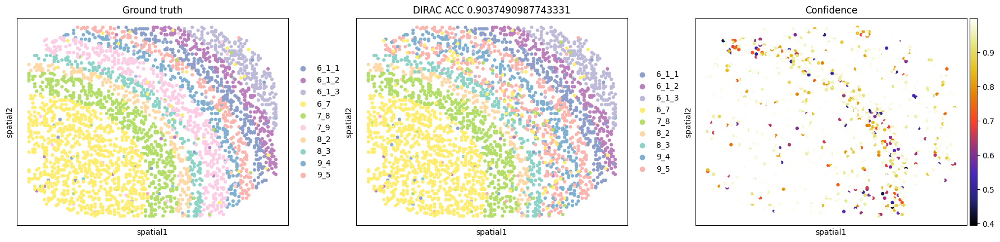

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.461590


Computing METIS partitioning...
Done!


Loss: 0.619197


Computing METIS partitioning...
Done!


Loss: 0.398094


Computing METIS partitioning...
Done!


Loss: 0.327846


Computing METIS partitioning...
Done!


Loss: 0.302947


Computing METIS partitioning...
Done!


Loss: 0.296309


Computing METIS partitioning...
Done!


Loss: 0.297039


Computing METIS partitioning...
Done!


Loss: 0.297368


Computing METIS partitioning...
Done!


Loss: 0.300456


Computing METIS partitioning...
Done!


Loss: 0.301602


Computing METIS partitioning...
Done!


Loss: 0.300796


Computing METIS partitioning...
Done!


Loss: 0.303876


Computing METIS partitioning...
Done!


Loss: 0.302011


Computing METIS partitioning...
Done!


Loss: 0.303912


Computing METIS partitioning...
Done!


Loss: 0.298841


Computing METIS partitioning...
Done!


Loss: 0.303298


Computing METIS partitioning...
Done!


Loss: 0.303371


Computing METIS partitioning...
Done!


Loss: 0.301530


Computing METIS partitioning...
Done!


Loss: 0.301328


Computing METIS partitioning...
Done!


Loss: 0.302583


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.171848


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.435367


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.265588


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.310350


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.264766


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.298218


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.313132


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.326671


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.300428


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.286736


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.312727


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.279203


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.337018


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.358655


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.332886


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.335506


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.334356


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.319147


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.357295


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.351129
{'Accuracy Score': 0.9104420731707317, 'Precision Score': 0.8491094801863327, 'Recall Score': 0.9104420731707317, 'F1 Score': 0.8754473032897262, 'Unassigned Rate': 0.09672977624784851}
############### [Batch 2] Randomly dropped cell types from source: ['7_9'] ###############


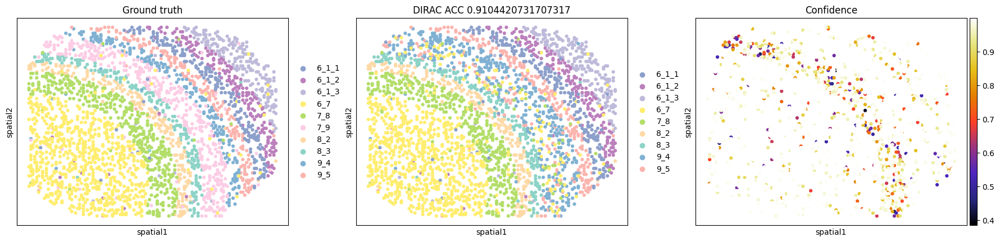

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.477631


Computing METIS partitioning...
Done!


Loss: 0.635350


Computing METIS partitioning...
Done!


Loss: 0.413642


Computing METIS partitioning...
Done!


Loss: 0.334424


Computing METIS partitioning...
Done!


Loss: 0.306970


Computing METIS partitioning...
Done!


Loss: 0.300823


Computing METIS partitioning...
Done!


Loss: 0.297428


Computing METIS partitioning...
Done!


Loss: 0.300379


Computing METIS partitioning...
Done!


Loss: 0.301657


Computing METIS partitioning...
Done!


Loss: 0.302470


Computing METIS partitioning...
Done!


Loss: 0.304049


Computing METIS partitioning...
Done!


Loss: 0.303595


Computing METIS partitioning...
Done!


Loss: 0.304350


Computing METIS partitioning...
Done!


Loss: 0.303994


Computing METIS partitioning...
Done!


Loss: 0.301810


Computing METIS partitioning...
Done!


Loss: 0.303317


Computing METIS partitioning...
Done!


Loss: 0.303661


Computing METIS partitioning...
Done!


Loss: 0.305218


Computing METIS partitioning...
Done!


Loss: 0.303371


Computing METIS partitioning...
Done!


Loss: 0.303242


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.205441


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.607903


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.286381


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.279451


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.259398


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.326184


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.339411


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.317626


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.186402


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.315944


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.314910


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.276602


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.344239


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.346540


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.281756


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.331177


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.344521


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.335664


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.338362


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.295747
{'Accuracy Score': 0.9071484071484072, 'Precision Score': 0.8475758493270017, 'Recall Score': 0.9071484071484072, 'F1 Score': 0.8730924011638206, 'Unassigned Rate': 0.14257161892071957}
############### [Batch 3] Randomly dropped cell types from source: ['7_9'] ###############


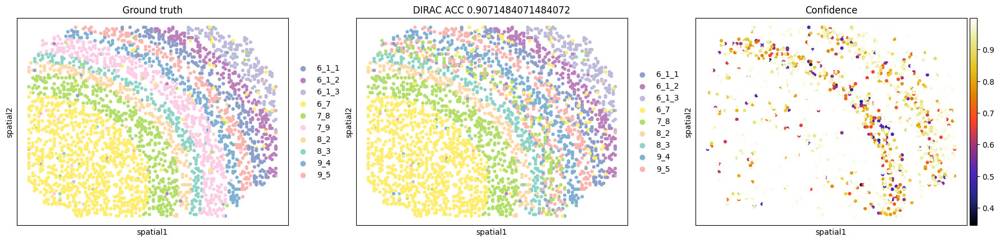

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.503037


Computing METIS partitioning...
Done!


Loss: 0.667380


Computing METIS partitioning...
Done!


Loss: 0.423069


Computing METIS partitioning...
Done!


Loss: 0.336766


Computing METIS partitioning...
Done!


Loss: 0.305508


Computing METIS partitioning...
Done!


Loss: 0.298110


Computing METIS partitioning...
Done!


Loss: 0.296628


Computing METIS partitioning...
Done!


Loss: 0.299722


Computing METIS partitioning...
Done!


Loss: 0.297045


Computing METIS partitioning...
Done!


Loss: 0.299865


Computing METIS partitioning...
Done!


Loss: 0.299091


Computing METIS partitioning...
Done!


Loss: 0.304775


Computing METIS partitioning...
Done!


Loss: 0.301196


Computing METIS partitioning...
Done!


Loss: 0.300443


Computing METIS partitioning...
Done!


Loss: 0.301791


Computing METIS partitioning...
Done!


Loss: 0.300419


Computing METIS partitioning...
Done!


Loss: 0.297473


Computing METIS partitioning...
Done!


Loss: 0.300404


Computing METIS partitioning...
Done!


Loss: 0.299267


Computing METIS partitioning...
Done!


Loss: 0.300351


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.166438


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.197950


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.257120


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.307224


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.264379


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.273719


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.299097


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.316374


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.292707


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.322035


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.336465


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.337506


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.320776


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.284438


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.313908


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.327923


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.329152


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.358231


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.336939


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.281689
{'Accuracy Score': 0.9024479356960176, 'Precision Score': 0.8490803897757648, 'Recall Score': 0.9024479356960176, 'F1 Score': 0.8692285915781748, 'Unassigned Rate': 0.09640145262462863}
############### [Batch 4] Randomly dropped cell types from source: ['7_9'] ###############


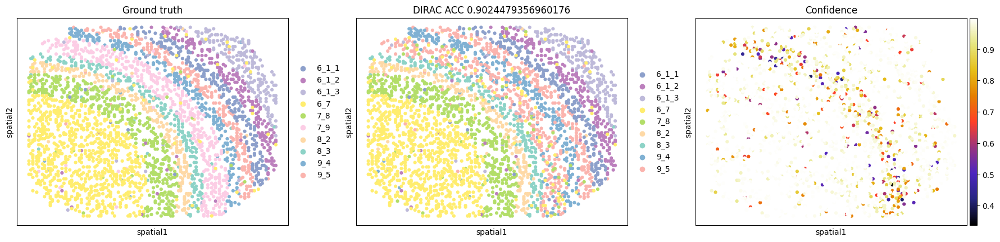

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.428576


Computing METIS partitioning...
Done!


Loss: 0.618488


Computing METIS partitioning...
Done!


Loss: 0.399800


Computing METIS partitioning...
Done!


Loss: 0.329262


Computing METIS partitioning...
Done!


Loss: 0.306525


Computing METIS partitioning...
Done!


Loss: 0.298086


Computing METIS partitioning...
Done!


Loss: 0.298290


Computing METIS partitioning...
Done!


Loss: 0.297541


Computing METIS partitioning...
Done!


Loss: 0.299690


Computing METIS partitioning...
Done!


Loss: 0.306084


Computing METIS partitioning...
Done!


Loss: 0.304528


Computing METIS partitioning...
Done!


Loss: 0.303490


Computing METIS partitioning...
Done!


Loss: 0.304170


Computing METIS partitioning...
Done!


Loss: 0.304538


Computing METIS partitioning...
Done!


Loss: 0.302817


Computing METIS partitioning...
Done!


Loss: 0.303477


Computing METIS partitioning...
Done!


Loss: 0.300796


Computing METIS partitioning...
Done!


Loss: 0.301294


Computing METIS partitioning...
Done!


Loss: 0.305416


Computing METIS partitioning...
Done!


Loss: 0.308563


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.140602


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.530777


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.224864


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.285036


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.321065


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.337056


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.293429


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.269296


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.339351


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.346605


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.253573


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.342152


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.361119


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.310160


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.320940


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.346018


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.300915


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.331506


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.335832


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.337968
{'Accuracy Score': 0.8984346559883509, 'Precision Score': 0.8358728454299773, 'Recall Score': 0.8984346559883509, 'F1 Score': 0.8611047917867545, 'Unassigned Rate': 0.09608423823626189}
############### [Batch 5] Randomly dropped cell types from source: ['7_9'] ###############


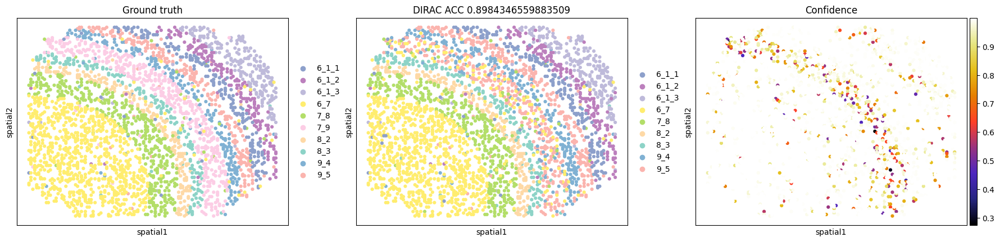

In [10]:
######## layers data + RNA
import os 
import argparse
import sys
sys.path.append("/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main") 
from utils import prepare_save_dir
from STELLAR import STELLAR
import numpy as np
import torch
import pandas as pd
import anndata
import scanpy as sc
import pickle
from collections import Counter
from datasets import GraphDataset, get_tonsilbe_edge_index, get_hubmap_edge_index
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import yaml
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42


parser = argparse.ArgumentParser(description='STELLAR')
parser.add_argument('--dataset', default='Hubmap', help='dataset setting')
parser.add_argument('--seed', type=int, default=1, metavar='S', help='random seed (default: 1)')
parser.add_argument('--name', type=str, default='STELLAR')
parser.add_argument('--epochs', type=int, default=20)
parser.add_argument('--lr', type=float, default=1e-3) # learning rate
parser.add_argument('--wd', type=float, default=5e-2) # weight decay
parser.add_argument('--num-heads', type=int, default=200)
parser.add_argument('--num-seed-class', type=int, default=0)
parser.add_argument('--sample-rate', type=float, default=0.5) # downsample dataset by using 50% of cells
parser.add_argument('-b', '--batch-size', default=1, type=int, metavar='N', help='mini-batch size')
parser.add_argument('--distance_thres', default=4, type=int)# distance threshold for constructing the graph
parser.add_argument('--savedir', type=str, default='./') # output directory
parser.add_argument('--use-processed-graph', type=bool, default=False) 


args = parser.parse_args(args=[])
args.cuda = torch.cuda.is_available()
args.device = torch.device("cuda" if args.cuda else "cpu")

data_path = "/home/users/nus/changxu/scratch/DIRAC/Section-4"
methods = "STELLAR"
sim_methods = "layers"
omics = "RNA"
tasks = "remove_one_celltype"
colormaps= ["#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", 
            "#CAB2D6","#6A3D9A", "#B15928"]
cell_type_col = 'cell.type'

adata = anndata.read_h5ad(os.path.join(data_path, "scMultiSim_data", f"sim-{sim_methods}", f"sim_{omics}_0.h5ad"))
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.scale(adata)
sc.pp.pca(adata)
colormaps_clusters = dict(set(zip(adata.obs[cell_type_col].unique(), colormaps)))
colormaps_clusters['unassigned'] = "#B15928"

results_list = []
for j in range(1, 6):
    save_path = os.path.join(data_path, "Results", f"merged_{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}")
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    source_adata_raw = adata[adata.obs["batch"] != j]
    target_adata = adata[adata.obs["batch"] == j]
    source_celltypes = source_adata_raw.obs['cell.type'].unique()
    drop_celltypes = ['7_9']

    source_adata = source_adata_raw[~source_adata_raw.obs['cell.type'].isin(drop_celltypes)].copy()
    source_adata.obs['celltype_num'] = pd.Categorical(source_adata.obs[cell_type_col]).codes
    pairs = dict(enumerate(pd.Categorical(source_adata.obs[cell_type_col]).categories))
    source_edge_index = get_hubmap_edge_index(source_adata.obsm["spatial"], source_adata.obs["batch"], distance_thres = args.distance_thres)
    target_edge_index = get_tonsilbe_edge_index(target_adata.obsm["spatial"].copy(), distance_thres = args.distance_thres)

    args.savedir = save_path
    args.num_heads = len(np.unique(source_adata.obs['cell.type']))
    dataset = GraphDataset(source_adata.X, source_adata.obs['celltype_num'], target_adata.X, source_edge_index, target_edge_index)
    stellar = STELLAR(args, dataset)
    stellar.train()
    _, results, prob = stellar.pred()
    target_adata = target_adata.copy()
    target_adata.obs[f"{methods}_pred"] = results
    target_adata.obs[f"{methods}"] = target_adata.obs[f"{methods}_pred"].map(pairs)
    conf, _ = prob.max(1)
    target_adata.obs["Confidence"] = conf.tolist()
    valid_mask = target_adata.obs["Confidence"] >= 0.9
    filtered_target = target_adata[valid_mask].copy()
    metrics_all = {
                "Accuracy Score": float(sklearn.metrics.accuracy_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"])),
                "Precision Score": float(sklearn.metrics.precision_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted', zero_division=0)),
                "Recall Score": float(sklearn.metrics.recall_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted')),
                "F1 Score": float(sklearn.metrics.f1_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted')),
                "Unassigned Rate": float(1 - len(filtered_target)/len(target_adata))
                    }
    print(metrics_all)
    with open(os.path.join(save_path, f"annotate_mertics_{tasks}_batch_{j}.yaml"), "w", encoding="utf-8") as g:
        yaml.dump(metrics_all, g, default_flow_style=False, allow_unicode=True)
    results_list.append(pd.Series(metrics_all, name=f"batch_{j}"))

    print(f"############### [Batch {j}] Randomly dropped cell types from source: {drop_celltypes} ###############")
    sc.pl.embedding(target_adata, basis='spatial', color=['cell.type', f'{methods}', "Confidence"], 
                        title=['Ground truth',f"DIRAC ACC {metrics_all['Accuracy Score']}", "Confidence"], 
                        s=80, show=False, palette = colormaps_clusters, color_map="CMRmap")
    plt.savefig(os.path.join(save_path, f"{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}.pdf"), dpi=300)
    plt.show()        
    target_adata.obs.to_csv(os.path.join(save_path, f"{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}.csv"))
        
summary_df = pd.DataFrame(results_list)
summary_df.to_csv(os.path.join(data_path, "Results", f"sim_metrics_{omics}_{methods}_{sim_methods}_{tasks}.csv"))

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.444407


Computing METIS partitioning...
Done!


Loss: 0.598056


Computing METIS partitioning...
Done!


Loss: 0.369550


Computing METIS partitioning...
Done!


Loss: 0.293373


Computing METIS partitioning...
Done!


Loss: 0.264479


Computing METIS partitioning...
Done!


Loss: 0.254585


Computing METIS partitioning...
Done!


Loss: 0.254665


Computing METIS partitioning...
Done!


Loss: 0.250967


Computing METIS partitioning...
Done!


Loss: 0.257159


Computing METIS partitioning...
Done!


Loss: 0.253923


Computing METIS partitioning...
Done!


Loss: 0.257799


Computing METIS partitioning...
Done!


Loss: 0.254214


Computing METIS partitioning...
Done!


Loss: 0.256404


Computing METIS partitioning...
Done!


Loss: 0.256844


Computing METIS partitioning...
Done!


Loss: 0.255416


Computing METIS partitioning...
Done!


Loss: 0.253330


Computing METIS partitioning...
Done!


Loss: 0.254998


Computing METIS partitioning...
Done!


Loss: 0.255963


Computing METIS partitioning...
Done!


Loss: 0.255419


Computing METIS partitioning...
Done!


Loss: 0.255606


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.188626


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.142804


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.251602


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.264449


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.235716


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.270221


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.290315


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.311268


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.297586


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.214788


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.297982


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.282769


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.304917


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.299596


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.292096


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.322538


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.290241


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.262845


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.320979


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.321920
{'Accuracy Score': 0.8269093504639543, 'Precision Score': 0.7111545608110047, 'Recall Score': 0.8269093504639543, 'F1 Score': 0.7592631606967564, 'Unassigned Rate': 0.07371900826446276}
############### [Batch 1] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


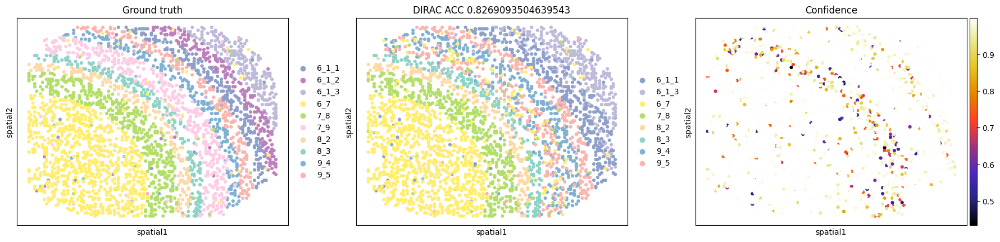

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.451472


Computing METIS partitioning...
Done!


Loss: 0.607127


Computing METIS partitioning...
Done!


Loss: 0.375426


Computing METIS partitioning...
Done!


Loss: 0.294712


Computing METIS partitioning...
Done!


Loss: 0.265314


Computing METIS partitioning...
Done!


Loss: 0.253665


Computing METIS partitioning...
Done!


Loss: 0.251212


Computing METIS partitioning...
Done!


Loss: 0.254163


Computing METIS partitioning...
Done!


Loss: 0.255611


Computing METIS partitioning...
Done!


Loss: 0.256031


Computing METIS partitioning...
Done!


Loss: 0.253952


Computing METIS partitioning...
Done!


Loss: 0.255348


Computing METIS partitioning...
Done!


Loss: 0.257110


Computing METIS partitioning...
Done!


Loss: 0.254921


Computing METIS partitioning...
Done!


Loss: 0.256831


Computing METIS partitioning...
Done!


Loss: 0.258117


Computing METIS partitioning...
Done!


Loss: 0.256194


Computing METIS partitioning...
Done!


Loss: 0.255310


Computing METIS partitioning...
Done!


Loss: 0.257901


Computing METIS partitioning...
Done!


Loss: 0.256058


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.150432


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.141549


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.252717


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.296246


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.255905


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.240784


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.301311


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.267775


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.284739


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.301868


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.124684


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.285329


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.317228


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.319595


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.307114


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.247697


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.285060


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.333250


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.337427


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.271897
{'Accuracy Score': 0.8455066921606118, 'Precision Score': 0.7537014469926226, 'Recall Score': 0.8455066921606118, 'F1 Score': 0.7894486135749637, 'Unassigned Rate': 0.09982788296041312}
############### [Batch 2] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


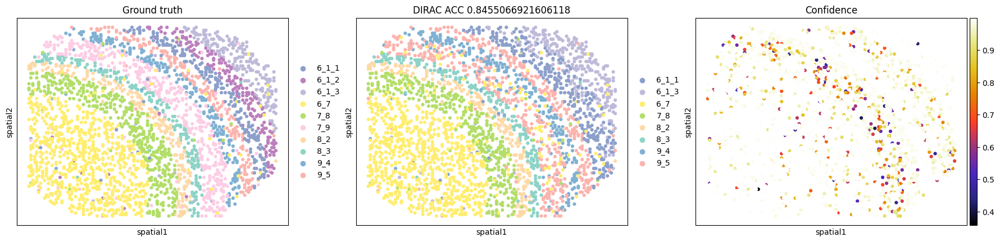

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.435258


Computing METIS partitioning...
Done!


Loss: 0.622031


Computing METIS partitioning...
Done!


Loss: 0.383631


Computing METIS partitioning...
Done!


Loss: 0.302903


Computing METIS partitioning...
Done!


Loss: 0.271760


Computing METIS partitioning...
Done!


Loss: 0.261690


Computing METIS partitioning...
Done!


Loss: 0.255870


Computing METIS partitioning...
Done!


Loss: 0.255561


Computing METIS partitioning...
Done!


Loss: 0.259319


Computing METIS partitioning...
Done!


Loss: 0.258619


Computing METIS partitioning...
Done!


Loss: 0.262063


Computing METIS partitioning...
Done!


Loss: 0.257995


Computing METIS partitioning...
Done!


Loss: 0.257778


Computing METIS partitioning...
Done!


Loss: 0.259287


Computing METIS partitioning...
Done!


Loss: 0.261310


Computing METIS partitioning...
Done!


Loss: 0.261341


Computing METIS partitioning...
Done!


Loss: 0.259080


Computing METIS partitioning...
Done!


Loss: 0.256079


Computing METIS partitioning...
Done!


Loss: 0.263672


Computing METIS partitioning...
Done!


Loss: 0.259108


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.172944


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.295199


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.251077


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.284093


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.288057


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.284006


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.273145


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.282880


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.293448


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.285508


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.299681


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.261655


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.289043


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.289101


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.292217


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.304639


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.303725


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.247939


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.299953


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.305496
{'Accuracy Score': 0.8219476744186046, 'Precision Score': 0.7133155188869136, 'Recall Score': 0.8219476744186046, 'F1 Score': 0.7567376451776104, 'Unassigned Rate': 0.08327781479013996}
############### [Batch 3] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


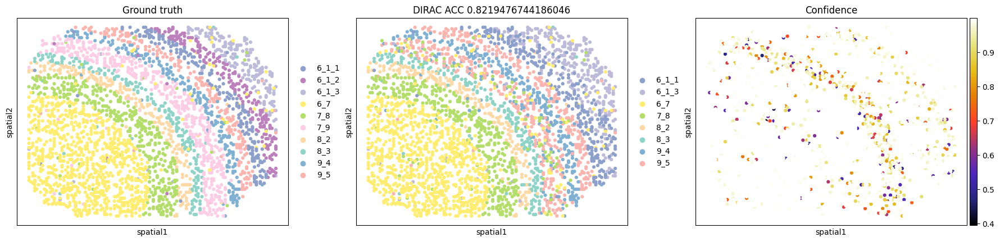

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.316354


Computing METIS partitioning...
Done!


Loss: 0.546187


Computing METIS partitioning...
Done!


Loss: 0.344530


Computing METIS partitioning...
Done!


Loss: 0.279732


Computing METIS partitioning...
Done!


Loss: 0.257862


Computing METIS partitioning...
Done!


Loss: 0.252805


Computing METIS partitioning...
Done!


Loss: 0.253275


Computing METIS partitioning...
Done!


Loss: 0.253017


Computing METIS partitioning...
Done!


Loss: 0.254354


Computing METIS partitioning...
Done!


Loss: 0.254621


Computing METIS partitioning...
Done!


Loss: 0.259133


Computing METIS partitioning...
Done!


Loss: 0.253936


Computing METIS partitioning...
Done!


Loss: 0.254469


Computing METIS partitioning...
Done!


Loss: 0.257691


Computing METIS partitioning...
Done!


Loss: 0.256196


Computing METIS partitioning...
Done!


Loss: 0.254285


Computing METIS partitioning...
Done!


Loss: 0.255271


Computing METIS partitioning...
Done!


Loss: 0.256298


Computing METIS partitioning...
Done!


Loss: 0.255395


Computing METIS partitioning...
Done!


Loss: 0.255397


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.180861


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.503714


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.249441


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.256071


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.290726


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.268900


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.149799


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.216005


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.226919


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.302208


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.295038


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.288752


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.235051


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.296750


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.317137


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.294451


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.293075


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.281700


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.284457


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.256724
{'Accuracy Score': 0.8409173643975246, 'Precision Score': 0.7344296204337684, 'Recall Score': 0.8409173643975246, 'F1 Score': 0.7783210546974781, 'Unassigned Rate': 0.09310003301419612}
############### [Batch 4] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


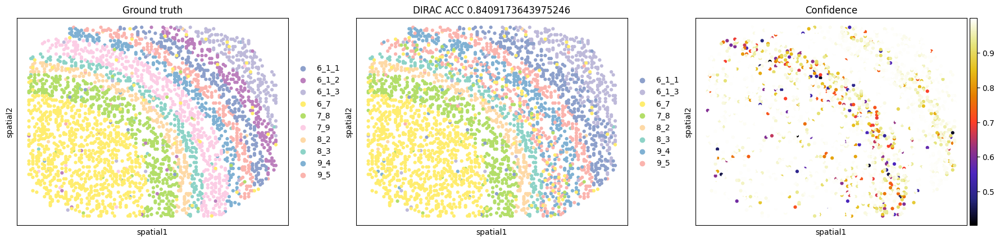

/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main/datasets.py:84: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  self.labeled_data = Data(x=torch.FloatTensor(labeled_X), edge_index=torch.LongTensor(labeled_edges).T, y=torch.LongTensor(labeled_y))
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 200 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(
/home/project/11003054/changxu/Conda_envs/dirac-env/lib/python3.9/site-packages/torch_geometric/deprecation.py:22: UserWarning: 'data.ClusterData' is deprecated, use 'loader.ClusterData' instead
  warnings.warn(out)
Computing

Loss: 1.303380


Computing METIS partitioning...
Done!


Loss: 0.554685


Computing METIS partitioning...
Done!


Loss: 0.354490


Computing METIS partitioning...
Done!


Loss: 0.285431


Computing METIS partitioning...
Done!


Loss: 0.261356


Computing METIS partitioning...
Done!


Loss: 0.253080


Computing METIS partitioning...
Done!


Loss: 0.254210


Computing METIS partitioning...
Done!


Loss: 0.258726


Computing METIS partitioning...
Done!


Loss: 0.256670


Computing METIS partitioning...
Done!


Loss: 0.255875


Computing METIS partitioning...
Done!


Loss: 0.260534


Computing METIS partitioning...
Done!


Loss: 0.256823


Computing METIS partitioning...
Done!


Loss: 0.260912


Computing METIS partitioning...
Done!


Loss: 0.259903


Computing METIS partitioning...
Done!


Loss: 0.256914


Computing METIS partitioning...
Done!


Loss: 0.255486


Computing METIS partitioning...
Done!


Loss: 0.258274


Computing METIS partitioning...
Done!


Loss: 0.257731


Computing METIS partitioning...
Done!


Loss: 0.258814


Computing METIS partitioning...
Done!


Loss: 0.254876


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.137741


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: 0.224961


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.256606


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.275156


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.283183


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.228127


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.287626


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.281188


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.274154


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.288152


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.284070


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.309042


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.320889


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.303685


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.250669


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.286973


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.311125


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.271836


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.306383


Computing METIS partitioning...
Done!
Computing METIS partitioning...
Done!


Loss: -0.321456
{'Accuracy Score': 0.8436599423631124, 'Precision Score': 0.742805398717744, 'Recall Score': 0.8436599423631124, 'F1 Score': 0.7837982798579897, 'Unassigned Rate': 0.08654162553471534}
############### [Batch 5] Randomly dropped cell types from source: ['7_9', '6_1_2'] ###############


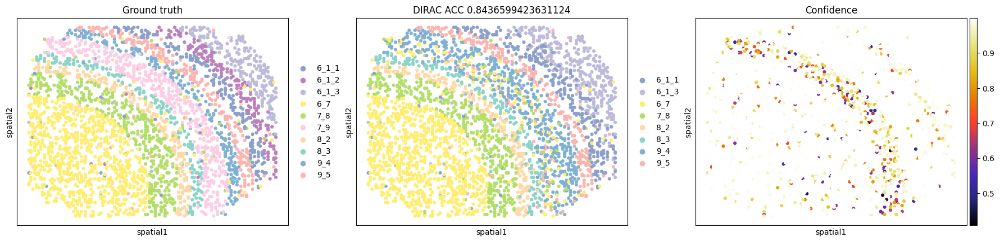

In [11]:
######## layers data + RNA
import os 
import argparse
import sys
sys.path.append("/home/project/11003054/changxu/Projects/SpaGNNs/Section3/CODEX/code/stellar-main") 
from utils import prepare_save_dir
from STELLAR import STELLAR
import numpy as np
import torch
import pandas as pd
import anndata
import scanpy as sc
import pickle
from collections import Counter
from datasets import GraphDataset, get_tonsilbe_edge_index, get_hubmap_edge_index
import sklearn
import matplotlib.pyplot as plt
import matplotlib as mpl
import yaml
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

parser = argparse.ArgumentParser(description='STELLAR')
parser.add_argument('--dataset', default='Hubmap', help='dataset setting')
parser.add_argument('--seed', type=int, default=1, metavar='S', help='random seed (default: 1)')
parser.add_argument('--name', type=str, default='STELLAR')
parser.add_argument('--epochs', type=int, default=20)
parser.add_argument('--lr', type=float, default=1e-3) # learning rate
parser.add_argument('--wd', type=float, default=5e-2) # weight decay
parser.add_argument('--num-heads', type=int, default=200)
parser.add_argument('--num-seed-class', type=int, default=0)
parser.add_argument('--sample-rate', type=float, default=0.5) # downsample dataset by using 50% of cells
parser.add_argument('-b', '--batch-size', default=1, type=int, metavar='N', help='mini-batch size')
parser.add_argument('--distance_thres', default=4, type=int)# distance threshold for constructing the graph
parser.add_argument('--savedir', type=str, default='./') # output directory
parser.add_argument('--use-processed-graph', type=bool, default=False) 


args = parser.parse_args(args=[])
args.cuda = torch.cuda.is_available()
args.device = torch.device("cuda" if args.cuda else "cpu")

data_path = "/home/users/nus/changxu/scratch/DIRAC/Section-4"
methods = "STELLAR"
sim_methods = "layers"
omics = "RNA"
tasks = "remove_two_celltype"
colormaps= ["#FED9A6", "#FBB4AE", "#8DD3C7", "#BEBADA", "#80B1D3", "#B3DE69", "#FCCDE5",
            "#BC80BD", "#FFED6F", "#8DA0CB", "#E78AC3", "#E5C494", "#CCCCCC", "#FB9A99", "#E31A1C", 
            "#CAB2D6","#6A3D9A", "#B15928"]
cell_type_col = 'cell.type'

adata = anndata.read_h5ad(os.path.join(data_path, "scMultiSim_data", f"sim-{sim_methods}", f"sim_{omics}_0.h5ad"))
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.scale(adata)
colormaps_clusters = dict(set(zip(adata.obs[cell_type_col].unique(), colormaps)))
colormaps_clusters['unassigned'] = "#B15928"

results_list = []
for j in range(1, 6):
    save_path = os.path.join(data_path, "Results", f"merged_{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}")
    if not os.path.exists(save_path):
        os.makedirs(save_path)

    source_adata_raw = adata[adata.obs["batch"] != j]
    target_adata = adata[adata.obs["batch"] == j]
    source_celltypes = source_adata_raw.obs['cell.type'].unique()
    drop_celltypes = ['7_9', '6_1_2']

    source_adata = source_adata_raw[~source_adata_raw.obs['cell.type'].isin(drop_celltypes)].copy()
    source_adata.obs['celltype_num'] = pd.Categorical(source_adata.obs[cell_type_col]).codes
    pairs = dict(enumerate(pd.Categorical(source_adata.obs[cell_type_col]).categories))
    source_edge_index = get_hubmap_edge_index(source_adata.obsm["spatial"], source_adata.obs["batch"], distance_thres = args.distance_thres)
    target_edge_index = get_tonsilbe_edge_index(target_adata.obsm["spatial"].copy(), distance_thres = args.distance_thres)

    args.savedir = save_path
    args.num_heads = len(np.unique(source_adata.obs['cell.type']))
    dataset = GraphDataset(source_adata.X, source_adata.obs['celltype_num'], target_adata.X, source_edge_index, target_edge_index)
    stellar = STELLAR(args, dataset)
    stellar.train()
    _, results, prob = stellar.pred()
    target_adata = target_adata.copy()
    target_adata.obs[f"{methods}_pred"] = results
    target_adata.obs[f"{methods}"] = target_adata.obs[f"{methods}_pred"].map(pairs)
    conf, _ = prob.max(1)
    target_adata.obs["Confidence"] = conf.tolist()
    valid_mask = target_adata.obs["Confidence"] >= 0.9
    filtered_target = target_adata[valid_mask].copy()
    metrics_all = {
                "Accuracy Score": float(sklearn.metrics.accuracy_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"])),
                "Precision Score": float(sklearn.metrics.precision_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted', zero_division=0)),
                "Recall Score": float(sklearn.metrics.recall_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted')),
                "F1 Score": float(sklearn.metrics.f1_score(
                    filtered_target.obs["cell.type"], 
                    filtered_target.obs[f"{methods}"], 
                    average='weighted')),
                "Unassigned Rate": float(1 - len(filtered_target)/len(target_adata))
                    }
    print(metrics_all)
    with open(os.path.join(save_path, f"annotate_mertics_{tasks}_batch_{j}.yaml"), "w", encoding="utf-8") as g:
        yaml.dump(metrics_all, g, default_flow_style=False, allow_unicode=True)
    results_list.append(pd.Series(metrics_all, name=f"batch_{j}"))

    print(f"############### [Batch {j}] Randomly dropped cell types from source: {drop_celltypes} ###############")
    sc.pl.embedding(target_adata, basis='spatial', color=['cell.type', f'{methods}', "Confidence"], 
                        title=['Ground truth',f"DIRAC ACC {metrics_all['Accuracy Score']}", "Confidence"], 
                        s=80, show=False, palette = colormaps_clusters, color_map="CMRmap")
    plt.savefig(os.path.join(save_path, f"{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}.pdf"), dpi=300)
    plt.show()        
    target_adata.obs.to_csv(os.path.join(save_path, f"{omics}_{methods}_{sim_methods}_batch_{j}_{tasks}.csv"))
        
summary_df = pd.DataFrame(results_list)
summary_df.to_csv(os.path.join(data_path, "Results", f"sim_metrics_{omics}_{methods}_{sim_methods}_{tasks}.csv"))

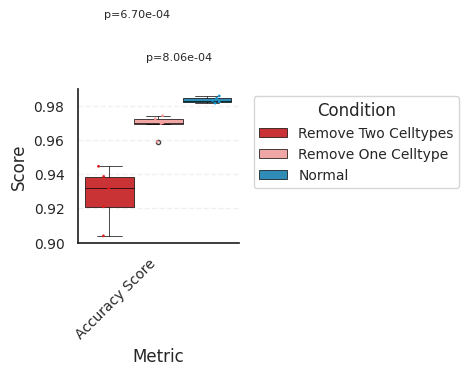

              Condition          Metric      mean       std
0  Remove Two Celltypes  Accuracy Score  0.927912  0.016111
1   Remove One Celltype  Accuracy Score  0.969148  0.005942
2                Normal  Accuracy Score  0.983549  0.001673


In [29]:
import os 
import scanpy as sc 
import functools
import yaml
import argparse
import functools
import pathlib
import scipy.stats as stats

import anndata
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

result_path = "/home/users/nus/changxu/scratch/DIRAC/Section-4"
methods = ["STELLAR","DIRAC"]
sim_methods = "layers"
omics = "RNA"
task_1 = "remove_one_celltype"
task_2 = "remove_two_celltype"

df_task_1 = pd.read_csv(os.path.join(result_path, f"sim_metrics_{omics}_{methods}_{sim_methods}_{task_1}.csv"))
df_task_2 = pd.read_csv(os.path.join(result_path, f"sim_metrics_{omics}_{methods}_{sim_methods}_{task_2}.csv"))
df_normal = pd.read_csv(os.path.join(result_path, f"sim_metrics_{omics}_{methods}_{sim_methods}.csv"))

df_task_1 = pd.DataFrame({'Accuracy Score': df_task_1['Accuracy Score'], 'Condition': 'Remove One Celltype'})
df_task_2 = pd.DataFrame({'Accuracy Score': df_task_2['Accuracy Score'], 'Condition': 'Remove Two Celltypes'})
df_normal = pd.DataFrame({'Accuracy Score': df_normal[:5]['Accuracy Score'], 'Condition': 'Normal'})

combined_df = pd.concat([df_normal, df_task_1, df_task_2], ignore_index=True)

melted_df = combined_df.melt(id_vars=['Condition'], 
                          value_vars=['Accuracy Score'],
                          var_name='Metric', 
                          value_name='Score')

palettes = {
    "Normal":"#1794CEFF",
    "Remove One Celltype": "#FB9A99", 
    "Remove Two Celltypes": "#E31A1C",
}

method_means = melted_df.groupby('Condition')['Score'].mean()
methods_sorted = method_means.sort_values(ascending=True).index.tolist()
    
melted_df['Condition'] = pd.Categorical(
        melted_df['Condition'],
        categories=methods_sorted,
        ordered=True
    )
    
min_score = melted_df['Score'].min()
max_score = melted_df['Score'].max()
y_min = max(0, min_score - 0.05 * (max_score - min_score))
y_max = min(1, max_score + 0.05 * (max_score - min_score))
    
sns.set(style="white", font_scale=1.1, rc={"axes.labelsize": 12, "xtick.labelsize": 10, "ytick.labelsize": 10})
    
plt.figure(figsize=(5, 5))
ax = sns.boxplot(
        data=melted_df,
        x='Metric',
        y='Score',
        hue='Condition',
        palette=palettes,
        hue_order=methods_sorted,
        width=0.7,
        linewidth=0.5,
        fliersize=3,
        boxprops=dict(edgecolor='black'),
        whiskerprops=dict(color='black'),
        capprops=dict(color='black'),
        medianprops=dict(color='black')
    )

sns.stripplot(
        data=melted_df,
        x='Metric',
        y='Score',
        hue='Condition',
        dodge=True,
        palette=palettes,
        hue_order=methods_sorted,
        alpha=1,
        size=2,
        jitter=True,
        marker='o',
        linewidth=0,
        ax=ax
    )
handles, labels = ax.get_legend_handles_labels()
n_methods = len(set(melted_df['Condition']))
ax.legend(handles[:n_methods], labels[:n_methods],
              title='Condition', title_fontsize=12, fontsize=10,
              bbox_to_anchor=(1.05, 1), loc='upper left')

metrics = melted_df['Metric'].unique()
x_positions = {metric: idx for idx, metric in enumerate(metrics)}

for metric in metrics:
    metric_df = melted_df[melted_df['Metric'] == metric]
    method_means_metric = metric_df.groupby('Condition', observed=True)['Score'].mean()
    top_methods = method_means_metric.sort_values(ascending=False).index.tolist()[:3]
    
    scores1 = metric_df[metric_df['Condition'] == top_methods[0]]['Score']
    scores2 = metric_df[metric_df['Condition'] == top_methods[1]]['Score']
    scores3 = metric_df[metric_df['Condition'] == top_methods[2]]['Score']
    
    stat_1vs2, p_value_1vs2 = stats.ttest_ind(scores1, scores2)
    stat_3vs2, p_value_3vs2 = stats.ttest_ind(scores3, scores2)
    
    x = x_positions[metric]
    y_base = metric_df['Score'].max()
    h = 0.01
    
    y1 = y_base + 0.01
    ax.plot([x-0.15, x-0.05], [y1, y1], color='black', linewidth=1.2)
    ax.text(x+0.1, y1 + 0.01, f'p={p_value_1vs2:.2e}', ha='center', va='bottom', fontsize=8)

    y2 = y_base + 0.04
    ax.plot([x+0.05, x+0.15], [y2, y2], color='black', linewidth=1.2)
    ax.text(x-0.1, y2 + 0.005, f'p={p_value_3vs2:.2e}', ha='center', va='bottom', fontsize=8)

plt.title(f'', fontsize=16, weight='bold', pad=20)
plt.xlabel('Metric', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.xticks(rotation=45, ha='right') 
    
ax.set_ylim(y_min, y_max)
ax.yaxis.grid(True, linestyle='--', alpha=0.3)
    
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(True)
ax.spines['left'].set_visible(True)

plt.tight_layout()
plt.savefig(os.path.join(result_path, f"sim_scMultiSim_metrics-remove_cell_types.pdf"), dpi=300)
plt.show()

grouped_stats = melted_df.groupby(['Condition', 'Metric'], observed=True)['Score'].agg(['mean', 'std']).reset_index()
print(grouped_stats)



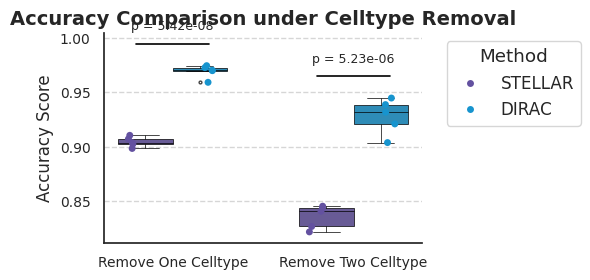

             Condition   Method      mean       std
0  Remove One Celltype    DIRAC  0.969148  0.005942
1  Remove One Celltype  STELLAR  0.904444  0.004579
2  Remove Two Celltype    DIRAC  0.927912  0.016111
3  Remove Two Celltype  STELLAR  0.835788  0.010643


In [31]:
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib as mpl
from scipy.stats import ttest_ind

# Set matplotlib font rendering
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42
sns.set(style="white", font_scale=1.1, rc={"axes.labelsize": 12, "xtick.labelsize": 10, "ytick.labelsize": 10})

# ==== Parameters and paths ====
result_path = "/home/users/nus/changxu/scratch/DIRAC/Section-4/Results"
methods = ["STELLAR", "DIRAC"]
sim_methods = "layers"
omics = "RNA"
task_1 = "remove_one_celltype"
task_2 = "remove_two_celltype"

# Task label mapping
task_labels = {
    task_1: "Remove One Celltype",
    task_2: "Remove Two Celltype"
}

# Custom method colors
custom_palette = {
    "STELLAR": "#6351A0FF",
    "DIRAC": "#1794CEFF"
}

# ==== Load data ====
def load_df(method, task):
    file_name = f"sim_metrics_{omics}_{method}_{sim_methods}_{task}.csv"
    path = os.path.join(result_path, file_name)
    df = pd.read_csv(path)
    df = df[['Accuracy Score']].copy()
    df['Method'] = method
    df['Condition'] = task_labels[task]
    return df

# Concatenate all combinations
df_all = pd.concat(
    [load_df(method, task) for method in methods for task in [task_1, task_2]],
    ignore_index=True
)

# Melt for seaborn
melted_df = df_all.melt(
    id_vars=["Method", "Condition"],
    value_vars=["Accuracy Score"],
    var_name="Metric",
    value_name="Score"
)

# ==== Plot ====
plt.figure(figsize=(6, 3))
ax = sns.boxplot(
    data=melted_df,
    x="Condition",
    y="Score",
    hue="Method",
    palette=custom_palette,
    width=0.6,
    fliersize=2,
    linewidth=0.5,
    boxprops=dict(edgecolor='black'),
    whiskerprops=dict(color='black'),
    capprops=dict(color='black'),
    medianprops=dict(color='black')
)
sns.stripplot(
    data=melted_df,
    x="Condition",
    y="Score",
    hue="Method",
    dodge=True,
    palette=custom_palette,
    alpha=1,
    size=5,
    jitter=True,
    marker='o',
    linewidth=0,
    ax=ax
)

# Remove duplicate legend entries
handles, labels = ax.get_legend_handles_labels()
unique_labels = dict(zip(labels, handles))
ax.legend(unique_labels.values(), unique_labels.keys(), title="Method", bbox_to_anchor=(1.05, 1), loc='upper left')

# ==== Add statistical test results ====
x_positions = {"Remove One Celltype": 0, "Remove Two Celltype": 1}

for condition, x in x_positions.items():
    subset = melted_df[melted_df['Condition'] == condition]

    if subset.empty:
        print(f"[WARNING] No data found for condition: {condition}")
        continue

    scores_stellar = subset[subset['Method'] == 'STELLAR']['Score']
    scores_dirac = subset[subset['Method'] == 'DIRAC']['Score']

    if scores_stellar.empty or scores_dirac.empty:
        print(f"[WARNING] Missing STELLAR or DIRAC data for condition: {condition}")
        continue

    stat, pval = ttest_ind(scores_stellar, scores_dirac)

    y = subset['Score'].max() + 0.02
    h = 0.01
    ax.plot([x - 0.2, x + 0.2], [y, y], color='black', linewidth=1.2)
    ax.text(x, y + h, f'p = {pval:.2e}', ha='center', va='bottom', fontsize=9)

# ==== Formatting ====
plt.ylabel('Accuracy Score', fontsize=12)
plt.xlabel('')
plt.xticks(rotation=0)
plt.ylim(melted_df['Score'].min()- 0.01, melted_df['Score'].max() + 0.03)
plt.title("Accuracy Comparison under Celltype Removal", fontsize=14, weight='bold')

# Remove extra borders
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.yaxis.grid(True, linestyle='--', alpha=0.8)

plt.tight_layout()

# ==== Save figure ====
output_path = os.path.join(result_path, f"sim_scMultiSim_metrics-2tasks-2methods.pdf")
plt.savefig(output_path, dpi=300)
plt.show()

# ==== Print statistics summary ====
grouped_stats = melted_df.groupby(['Condition', 'Method'], observed=True)['Score'].agg(['mean', 'std']).reset_index()
print(grouped_stats)

